This notebook demonstrates how to run the inference of PPN (Point Proposal Network). The goal is to predict the starting / ending points of tracks and showers. For each point we predict a 3D position, a score and a type (one of 5 types: HIP, MIP, shower, delta, or michel).

**The most recent code for PPN is available on the branch `develop` of [Temigo/lartpc_mlreco3d](https://github.com/Temigo/lartpc_mlreco3d).**

0. [Setup](#0.-Setup)

1. [Configuration and inference](#1.-Configuration-and-inference)

2. [Visualize input](##2.-Visualize-input)

3. [Visualize predictions](#3.-Visualize-predictions)

4. [Metrics](#4.-Metrics)

![PPN architecture](ppn.png)

**Jargon**
We call PPN1 the deepest feature map / convolutions, at the coarsest spatial resolution. In the example above, the 4x4 feature map on the right. We call PPN2 the operations on the intermediate level, in between the coarsest and original spatial resolutions. Occasionally PPN3 refers to operations done at the original spatial size.


![What we want](ppn2.png)

## 0. Setup
First you should load your own version of `lartpc_mlreco3d` code (change the path):

In [1]:
import sys
sys.path.append("/u/ki/ldomine/lartpc_mlreco3d/")

We import useful libraries like NumPy, Seaborn, and Plotly, as well as useful functions from the `lartpc_mlreco3d` code.

In [2]:
import numpy as np
import matplotlib
from matplotlib import pyplot as plt
import seaborn
import scipy
import yaml
import plotly.graph_objs as go
from plotly.offline import iplot, init_notebook_mode
init_notebook_mode(connected=False)

In [3]:
from mlreco.utils.ppn import uresnet_ppn_type_point_selector, uresnet_ppn_point_selector
from mlreco.main_funcs import process_config, prepare
from mlreco.visualization import scatter_points, scatter_cubes, plotly_layout3d

## 1. Configuration and inference
First we define the configuration of the network and load the weights. I will not comment more on the details of this config file as it has already been done. The keys specific to PPN are in the `ppn` section:

* `downsample_ghost`
* `ppn_num_conv`
* `true_distance_ppn1`, `true_distance_ppn2` and `true_distance_ppn3`
* `score_threshold`

In [4]:
cfg = '''
iotool:
  batch_size: 64
  minibatch_size: 64
  shuffle: False
  num_workers: 1
  collate_fn: CollateSparse
  dataset:
    name: LArCVDataset
    data_keys:
      - /gpfs/slac/staas/fs1/g/neutrino/ldomine/icarus_workshop_data/icarus_test*.root
    limit_num_files: 20
    schema:
      input_data:
        - parse_sparse3d_scn
        - sparse3d_reco
#        - sparse3d_reco_inv_chi2
#        - sparse3d_reco_hit_charge0
#        - sparse3d_reco_hit_charge1
#        - sparse3d_reco_hit_charge2
#        - sparse3d_reco_hit_rms0
#        - sparse3d_reco_hit_rms1
#        - sparse3d_reco_hit_rms2
#        - sparse3d_reco_hit_time0
#        - sparse3d_reco_hit_time1
#        - sparse3d_reco_hit_time2
#        - sparse3d_reco_occupancy
      ghost_label:
        - parse_sparse3d_scn
        - sparse3d_fivetypes_reco
      point_label:
        - parse_particle_points
        - sparse3d_reco
        - particle_mcst
model:
  name: uresnet_ppn_chain
  modules:
    uresnet_lonely:
      num_strides: 5
      filters: 16
      num_classes: 5
      data_dim: 3
      spatial_size: 768
      ghost: True
      features: 1
      model_path: '/gpfs/slac/staas/fs1/g/neutrino/ldomine/pi0_workshop_train/weights_ppn18/snapshot-5699.ckpt'
    ppn:
      num_strides: 5
      filters: 16
      num_classes: 5
      data_dim: 3
      downsample_ghost: True
      ppn_num_conv: 3
      true_distance_ppn1: 1.0
      true_distance_ppn2: 2.0
      true_distance_ppn3: 5.0
      use_encoding: False
      ppn1_size: 48
      ppn2_size: 192
      spatial_size: 768
      model_path: '/gpfs/slac/staas/fs1/g/neutrino/ldomine/pi0_workshop_train/weights_ppn18/snapshot-5699.ckpt'
  network_input:
    - input_data
    - point_label
  loss_input:
    - ghost_label
    - point_label
trainval:
  seed: 123
  learning_rate: 0.001
  unwrapper: unwrap_3d_scn
  gpus: ''
  weight_prefix: weights_trash/snapshot
  iterations: 10
  report_step: 1
  checkpoint_step: 500
  log_dir: log_trash
  model_path: '/gpfs/slac/staas/fs1/g/neutrino/ldomine/pi0_workshop_train/weights_ppn18/snapshot-5699.ckpt'
  train: False
  debug: False
'''

In [5]:
cfg = yaml.load(cfg,Loader=yaml.Loader)
# pre-process configuration (checks + certain non-specified default settings)
process_config(cfg)
# prepare function configures necessary "handlers"
handlers = prepare(cfg)


Config processed at: Linux hep-gpu01 3.10.0-957.12.2.el7.x86_64 #1 SMP Tue May 14 21:24:32 UTC 2019 x86_64 x86_64 x86_64 GNU/Linux

$CUDA_VISIBLE_DEVICES=""

{   'iotool': {   'batch_size': 64,
                  'collate_fn': 'CollateSparse',
                  'dataset': {   'data_keys': [   '/gpfs/slac/staas/fs1/g/neutrino/ldomine/icarus_workshop_data/icarus_test*.root'],
                                 'limit_num_files': 20,
                                 'name': 'LArCVDataset',
                                 'schema': {   'ghost_label': [   'parse_sparse3d_scn',
                                                                  'sparse3d_fivetypes_reco'],
                                               'input_data': [   'parse_sparse3d_scn',
                                                                 'sparse3d_reco'],
                                               'point_label': [   'parse_particle_points',
                                                                  '

Now we are ready to run the inference for one batch.

In [6]:
data, output = handlers.trainer.forward(handlers.data_io_iter)

## 2. Visualize input

Let's visualize some of the results. For that we pick one event for example:

In [35]:
entry = 10

We can extract all necessary information from the original data (`data`) and the results of the inference (`output`).

In [36]:
# XYZ and "charge"
edep = data['input_data'][entry]
x, y, z, energy = edep[:, 0], edep[:, 1], edep[:, 2], edep[:, 4]

# Semantics
# 0,1,2,3,4 = true points with 5 semantic classes
# 5 = ghost points
label_semantic = data['ghost_label'][entry][:, -1]
pred_semantic  = np.argmax(output['segmentation'][entry], axis=1)
pred_ghost = np.argmax(output['ghost'][entry], axis=1)  # 0 = nonghost, 1 = ghost

pred_nonghost_mask = pred_ghost == 0
true_nonghost_mask = label_semantic < 5

# Points
true_points = data['point_label'][entry]
pred_points = output['points'][entry]

### Energy deposits with and without showing (true) ghost points

In [9]:
trace = scatter_points(edep, markersize=1, color=edep[:, 4], colorscale='Jet')
fig = go.Figure(data=trace,layout=plotly_layout3d())
iplot(fig)

In [10]:
trace = scatter_points(edep[true_nonghost_mask], markersize=1, color=edep[true_nonghost_mask][:, 4], colorscale='Jet')
fig = go.Figure(data=trace,layout=plotly_layout3d())
iplot(fig)

### True labels without showing ghost points

Each voxel color corresponds to one of the five semantic classes: HIP, MIP, EM shower, delta ray, Michel electron. In addition each PPN true point has a corresponding true type among these 5 types.

In [37]:
trace_truth = scatter_points(edep[true_nonghost_mask], markersize=1, color=label_semantic[true_nonghost_mask], colorscale='Portland', cmin=0, cmax=4)
trace_points = scatter_points(true_points, markersize=5, color=true_points[:, -1], colorscale='Portland', cmin=0, cmax=4)
fig = go.Figure(data=trace_truth + trace_points,layout=plotly_layout3d())
iplot(fig)

## 3. Visualize predictions
The raw output of PPN is a bit messy: there is one point predicted for each nonzero voxel, along with a score and a type prediction. We have to use the predicted masks at different spatial sizes and the scores to do some postprocessing. This is done in the function `uresnet_ppn_type_point_selector` if you want to rely on the point type predictions, or `uresnet_ppn_point_selector` otherwise. There are a few parameters that you can tweak:
* `score_threshold` is a threshold on the score predicted for each point by PPN
* `type_threshold` is a distance threshold enforcing closeness between points of (predicted) type X and voxels of (predicted) type X.
* `nms_score_threshold` is a threshold for the overlap computed in NMS algorithm (higher threshold means less points removed)
* `window_size` is the size used in NMS algorithm to define a square window around each predicted point.

In [44]:
#ppn = uresnet_ppn_type_point_selector(edep, output, entry=entry, score_threshold=0.05, type_threshold=2)
ppn = uresnet_ppn_point_selector(edep, output, entry=entry, score_threshold=0.0, nms_score_threshold=0.9, window_size=2)
print(ppn.shape)
ppn_voxels = ppn[:, :3]
ppn_type = ppn[:, -1]
#ppn_scores = ppn_type#np.zeros_like(ppn_type)

(323, 5)


### Predictions (semantic predictions, for predicted nonghost points)

In [45]:
trace_pred = scatter_points(edep[pred_nonghost_mask], markersize=1, color=pred_semantic[pred_nonghost_mask], colorscale='Portland', cmin=0, cmax=4)
trace_points = scatter_points(ppn_voxels, markersize=5, color=ppn_type, colorscale='Portland', cmin=0, cmax=4)
# Do not display type
# trace_points = scatter_points(ppn_voxels, markersize=5, color='orange')
# Display true points as well
# trace_points_true = scatter_points(true_points, markersize=5, color='green')
fig = go.Figure(data=trace_pred + trace_points,layout=plotly_layout3d())
iplot(fig)

## 4. Metrics

We loop over the batch computing pairwise distances to produce some useful metrics. Again feel free to chose whichever postprocessing method you prefer (`uresnet_ppn_type_point_selector`, `uresnet_ppn_point_selector` or your own custom function).

In [14]:
from scipy.spatial.distance import cdist
seaborn.set(rc={
    'figure.figsize':(15, 10),
})
seaborn.set_context('talk') # or paper

In [15]:
# For each true point, record the distance to the closest predicted point
closest_ppn_point = []
# For each predicted point, record the distance to the closest true point
closest_true_point = []
# For each true point, record the distance to the closest edep left after deghosting
closest_deghosted_edep = []

true_types = []
pred_types = []

for entry in range(cfg['iotool']['batch_size']):
    true_points = data['point_label'][entry]
    edep = data['input_data'][entry]
    pred_nonghost_mask = np.argmax(output['ghost'][entry], axis=1) == 0
    
    # --- Choose your postprocessing function here ---
    ppn = uresnet_ppn_type_point_selector(edep, output, entry=entry, score_threshold=0.2, type_threshold=2)
    # ppn = uresnet_ppn_point_selector(edep, output, entry=entry, score_threshold=0.2, nms_score_threshold=0.8, window_size=2)

    
    ppn_voxels = ppn[:, :3]
    if ppn_voxels.shape[0] > 0:
        distances = cdist(true_points[:, :3], ppn_voxels)
        if distances.shape[1] > 0:
            closest_ppn_point.extend(distances.min(axis=1))
        if distances.shape[0] > 0:
            closest_true_point.extend(distances.min(axis=0))

        d = cdist(true_points[:, :3], edep[pred_nonghost_mask][:, :3])
        closest_deghosted_edep.extend(d.min(axis=1))

        true_types.extend(true_points[:, -1])
        pred_types.extend(ppn[:, -1])
    
closest_ppn_point = np.array(closest_ppn_point)
closest_true_point = np.array(closest_true_point)
closest_deghosted_edep = np.array(closest_deghosted_edep)
true_types = np.array(true_types)
pred_types = np.array(pred_types)
print(true_types.shape, closest_ppn_point.shape)

(961,) (961,)


### 4.1 Distance from true points to the closest predicted point

In [23]:
boundary = 20

fraction = (closest_ppn_point>boundary).sum() / float(len(closest_ppn_point))
print('Fraction of true points at a distance > %dpx of any PPN point:' % boundary, fraction)
fraction2 = (closest_deghosted_edep>boundary).sum() / float(len(closest_deghosted_edep))
print('Fraction of true points at a distance > %dpx of any point after deghosting: ' % boundary, fraction2)

Fraction of true points at a distance > 20px of any PPN point: 0.45369406867845996
Fraction of true points at a distance > 20px of any point after deghosting:  0.1529656607700312


Text(0, 0.5, 'True points')

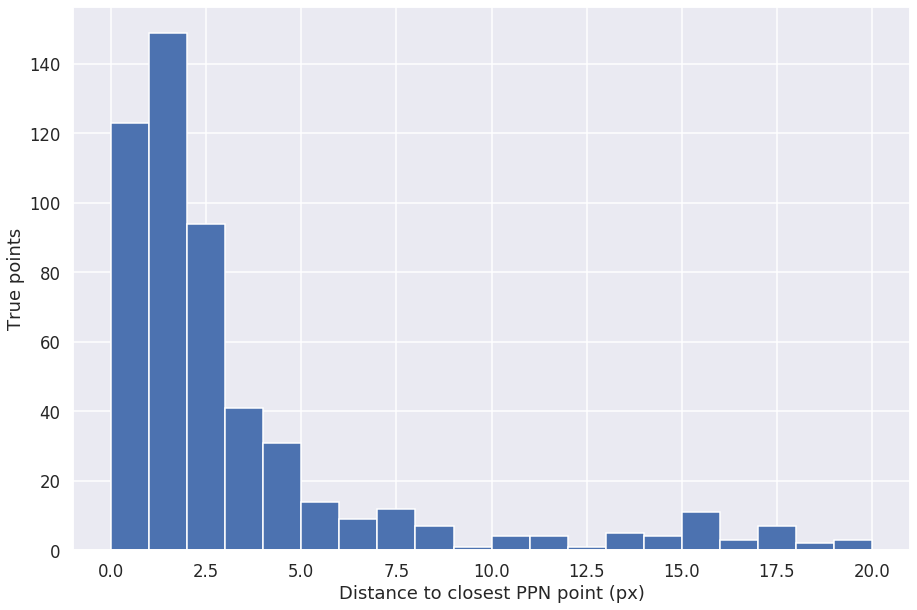

In [24]:
plt.hist(closest_ppn_point, range=[0, boundary], bins=20)
plt.xlabel('Distance to closest PPN point (px)')
plt.ylabel('True points')

### 4.2 Distance from predicted points to the closest true point

In [18]:
boundary = 100

fraction = (closest_true_point>boundary).sum() / float(len(closest_true_point))
print('Fraction of predicted points at a distance >%dpx of any true point: ' % boundary, fraction)

Fraction of predicted points at a distance >100px of any true point:  0.19751626256652868


Text(0, 0.5, 'Predicted PPN points')

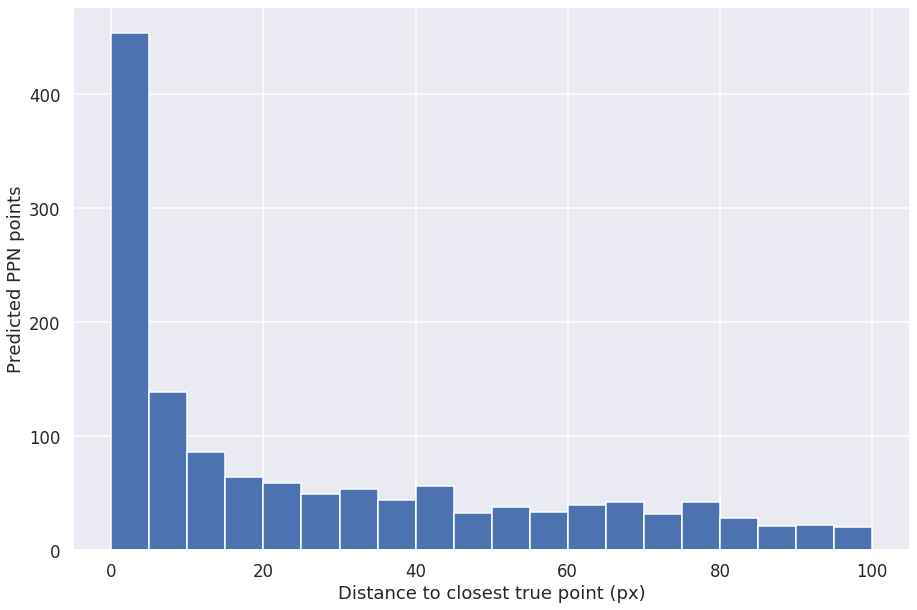

In [19]:
plt.hist(closest_true_point, range=[0, boundary], bins=20)
plt.xlabel('Distance to closest true point (px)')
plt.ylabel('Predicted PPN points')

### 4.3 Shower starting points

In [20]:
boundary = 20
shower_mask = true_types == 2
x = shower_mask.astype(int).sum()/float(shower_mask.shape[0])
print('Looking at points for true showers only, ie %f of true points' % x)

fraction = (closest_ppn_point[shower_mask]>boundary).sum() / float(len(closest_ppn_point[shower_mask]))
print('Fraction of true points at a distance > %dpx of any PPN point:' % boundary, fraction)
fraction2 = (closest_deghosted_edep[shower_mask]>boundary).sum() / float(len(closest_deghosted_edep[shower_mask]))
print('Fraction of true points at a distance > %dpx of any point after deghosting: ' % boundary, fraction2)

Looking at points for true showers only, ie 0.107180 of true points
Fraction of true points at a distance > 20px of any PPN point: 0.5339805825242718
Fraction of true points at a distance > 20px of any point after deghosting:  0.13592233009708737


Text(0, 0.5, 'True points')

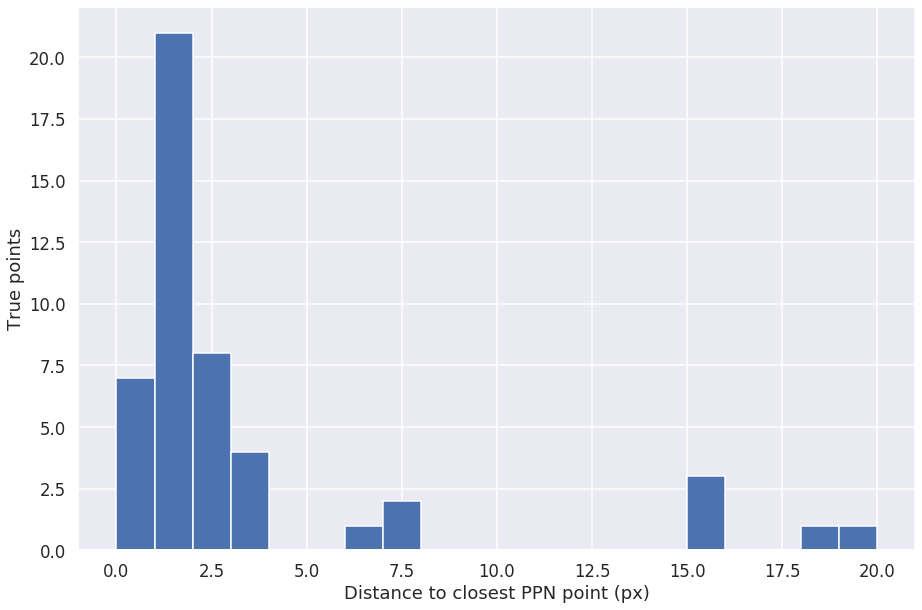

In [21]:
plt.hist(closest_ppn_point[shower_mask], range=[0, boundary], bins=20)
plt.xlabel('Distance to closest PPN point (px)')
plt.ylabel('True points')

In [22]:
# import mlreco
# import importlib
# importlib.reload(mlreco.utils.ppn)